Adapted from [Hands On Image Processing with Python](https://github.com/PacktPublishing/Hands-On-Image-Processing-with-Python) and [Learning OpenCV4 Computer Vision with Python 3](https://github.com/PacktPublishing/Learning-OpenCV-4-Computer-Vision-with-Python-Third-Edition)

In [0]:
!git clone https://github.com/PacktPublishing/Hands-On-Image-Processing-with-Python.git

Cloning into 'Hands-On-Image-Processing-with-Python'...
remote: Enumerating objects: 6, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 725 (delta 1), reused 1 (delta 0), pack-reused 719
Receiving objects: 100% (725/725), 237.23 MiB | 34.37 MiB/s, done.
Resolving deltas: 100% (146/146), done.
Checking out files: 100% (182/182), done.


In [0]:
IMAGE_DIR = '/content/Hands-On-Image-Processing-with-Python/images/'

In [0]:
from skimage.color import rgb2gray
from skimage.io import imread
from matplotlib import pylab as pylab

##**BRIEF**

In [0]:
from skimage import transform as transform
from skimage.feature import (match_descriptors, corner_peaks, corner_harris, plot_matches, BRIEF)

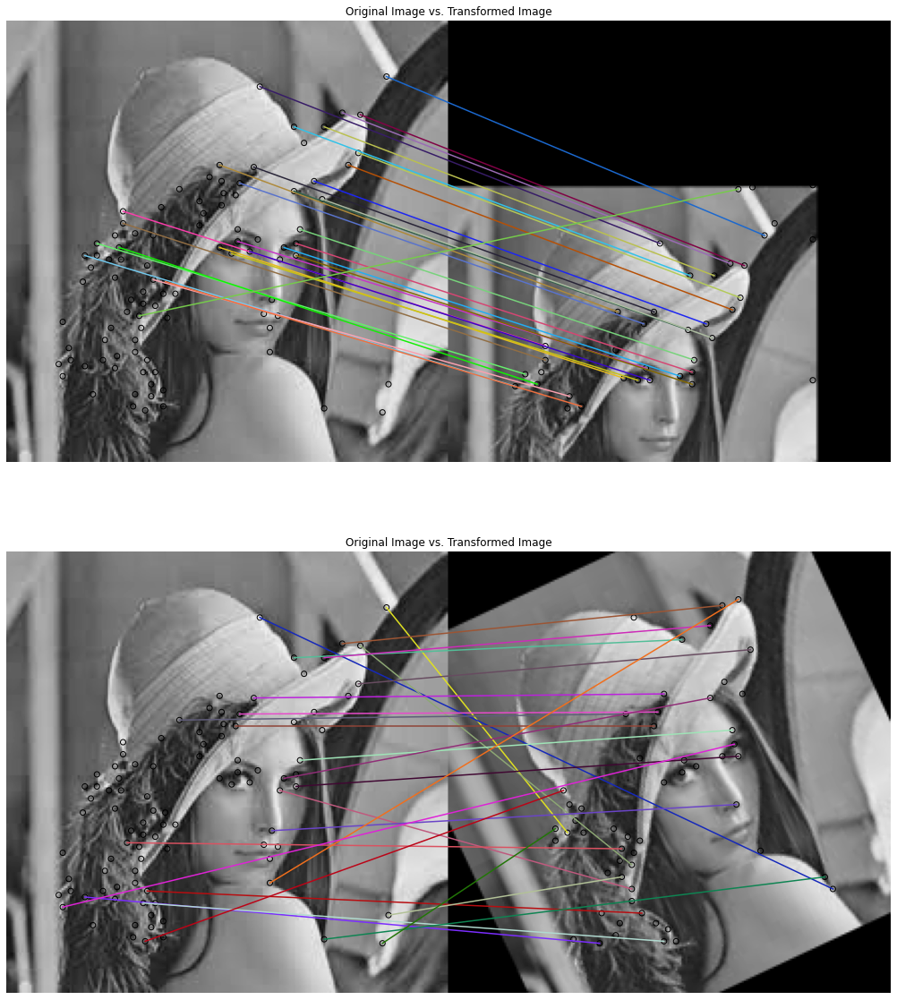

((0.0, 440.0, 220.0, 0.0),
 Text(0.5, 1.0, 'Original Image vs. Transformed Image'),
 None)

In [0]:
img1 = rgb2gray(imread(IMAGE_DIR+'lena.jpg'))
affine_trans = transform.AffineTransform(scale=(1.2, 1.2), translation=(0,-100))
img2 = transform.warp(img1, affine_trans)
img3 = transform.rotate(img1, 25)
coords1, coords2, coords3 = corner_harris(img1), corner_harris(img2), corner_harris(img3)
coords1[coords1 > 0.01*coords1.max()] = 1
coords2[coords2 > 0.01*coords2.max()] = 1
coords3[coords3 > 0.01*coords3.max()] = 1
keypoints1 = corner_peaks(coords1, min_distance=5)
keypoints2 = corner_peaks(coords2, min_distance=5)
keypoints3 = corner_peaks(coords3, min_distance=5)
extractor = BRIEF()
extractor.extract(img1, keypoints1)
keypoints1, descriptors1 = keypoints1[extractor.mask], extractor.descriptors
extractor.extract(img2, keypoints2)
keypoints2, descriptors2 = keypoints2[extractor.mask], extractor.descriptors
extractor.extract(img3, keypoints3)
keypoints3, descriptors3 = keypoints3[extractor.mask], extractor.descriptors
matches12 = match_descriptors(descriptors1, descriptors2, cross_check=True)
matches13 = match_descriptors(descriptors1, descriptors3, cross_check=True)
fig, axes = pylab.subplots(nrows=2, ncols=1, figsize=(20,20))
pylab.gray(), plot_matches(axes[0], img1, img2, keypoints1, keypoints2, matches12)
axes[0].axis('off'), axes[0].set_title("Original Image vs. Transformed Image")
plot_matches(axes[1], img1, img3, keypoints1, keypoints3, matches13)
axes[1].axis('off'), axes[1].set_title("Original Image vs. Transformed Image"), pylab.show()

## **ORB**

In [0]:
from skimage import transform as transform
from skimage.feature import (match_descriptors, ORB, plot_matches)

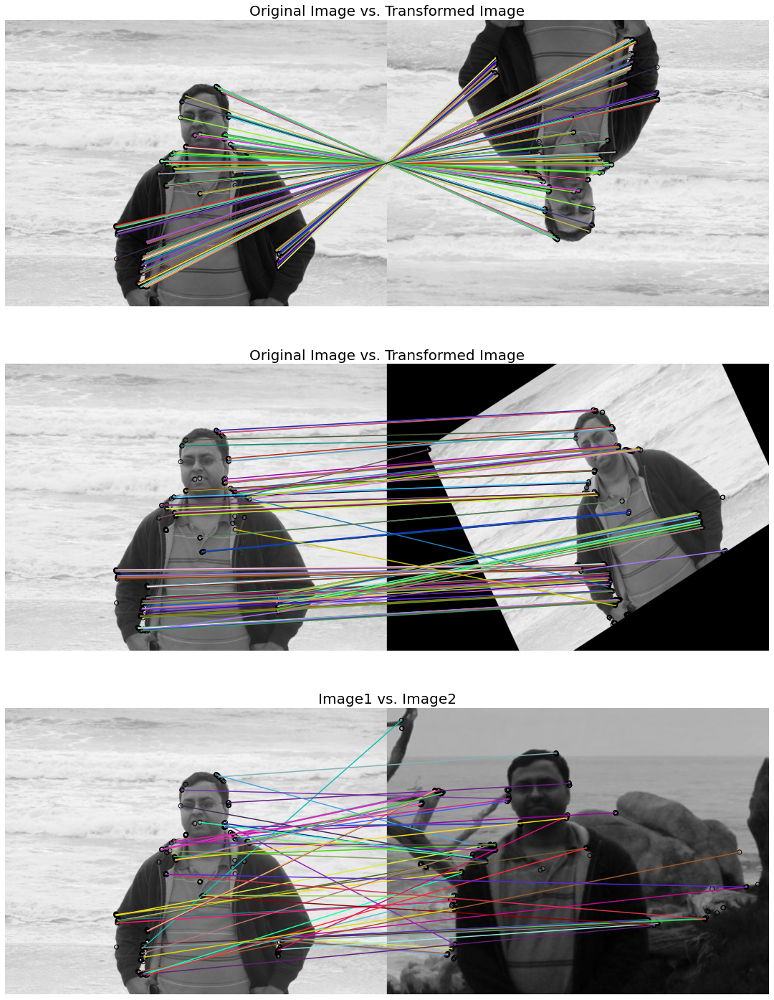

In [0]:
img1 = rgb2gray(imread(IMAGE_DIR+ 'me5.jpg'))
img2 = transform.rotate(img1, 180)
affine_trans = transform.AffineTransform(scale=(1.3, 1.1), rotation=0.5, translation=(0, -200))
img3 = transform.warp(img1, affine_trans)
img4 = transform.resize(rgb2gray(imread(IMAGE_DIR+'me6.jpg')), img1.shape, anti_aliasing=True)
descriptor_extractor = ORB(n_keypoints=200)
descriptor_extractor.detect_and_extract(img1)
keypoints1, descriptors1 = descriptor_extractor.keypoints, descriptor_extractor.descriptors
descriptor_extractor.detect_and_extract(img2)
keypoints2, descriptors2 = descriptor_extractor.keypoints, descriptor_extractor.descriptors
descriptor_extractor.detect_and_extract(img3)
keypoints3, descriptors3 = descriptor_extractor.keypoints, descriptor_extractor.descriptors
descriptor_extractor.detect_and_extract(img4)
keypoints4, descriptors4 = descriptor_extractor.keypoints, descriptor_extractor.descriptors
matches12 = match_descriptors(descriptors1, descriptors2, cross_check=True)
matches13 = match_descriptors(descriptors1, descriptors3, cross_check=True)
matches14 = match_descriptors(descriptors1, descriptors4, cross_check=True)
fig, axes = pylab.subplots(nrows=3, ncols=1, figsize=(20,25))
pylab.gray()
plot_matches(axes[0], img1, img2, keypoints1, keypoints2, matches12)
axes[0].axis('off'), axes[0].set_title("Original Image vs. Transformed Image", size=20)
plot_matches(axes[1], img1, img3, keypoints1, keypoints3, matches13)
axes[1].axis('off'), axes[1].set_title("Original Image vs. Transformed Image", size=20)
plot_matches(axes[2], img1, img4, keypoints1, keypoints4, matches14)
axes[2].axis('off'), axes[2].set_title("Image1 vs. Image2", size=20)
pylab.show()

## **Matching a logo in two images**

In [0]:
!git clone https://github.com/PacktPublishing/Learning-OpenCV-4-Computer-Vision-with-Python-Third-Edition.git

Cloning into 'Learning-OpenCV-4-Computer-Vision-with-Python-Third-Edition'...
remote: Enumerating objects: 97, done.
remote: Counting objects: 100% (97/97), done.
remote: Compressing objects: 100% (74/74), done.
remote: Total 1443 (delta 45), reused 61 (delta 22), pack-reused 1346
Receiving objects: 100% (1443/1443), 211.26 MiB | 34.79 MiB/s, done.
Resolving deltas: 100% (507/507), done.
Checking out files: 100% (365/365), done.


In [0]:
IMAGE_DIR = '/content/Learning-OpenCV-4-Computer-Vision-with-Python-Third-Edition/images/'

In [0]:
import cv2
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow

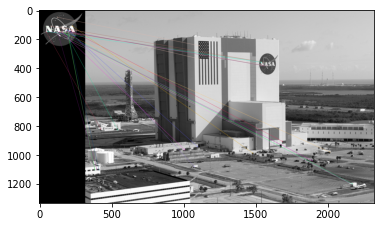

In [0]:
# Load the images.
img0 = cv2.imread(IMAGE_DIR + 'nasa_logo.png',
                  cv2.IMREAD_GRAYSCALE)
img1 = cv2.imread(IMAGE_DIR + 'kennedy_space_center.jpg',
                  cv2.IMREAD_GRAYSCALE)



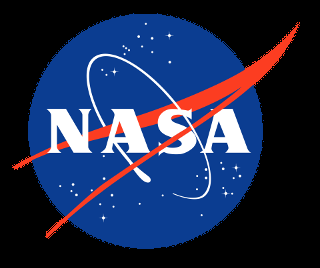

In [0]:
cv2_imshow(cv2.imread(IMAGE_DIR + 'nasa_logo.png'))

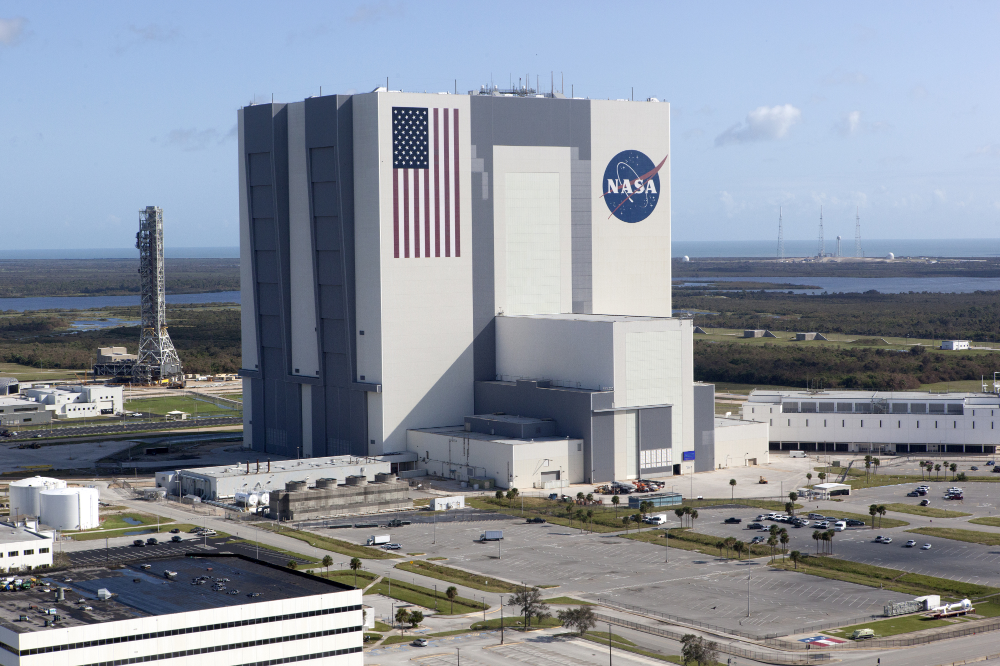

In [0]:
cv2_imshow(cv2.imread(IMAGE_DIR + 'kennedy_space_center.jpg'))

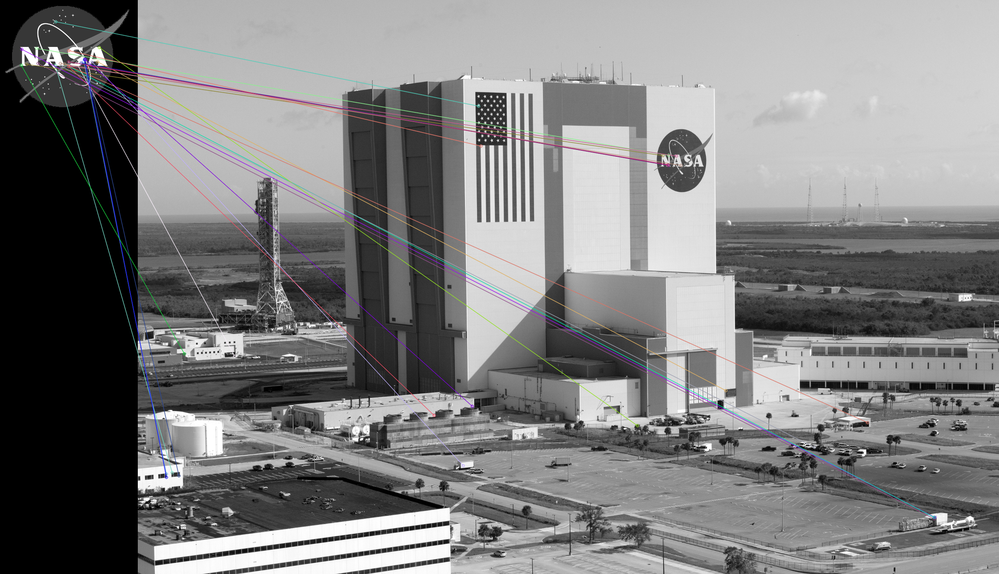

In [0]:
# Perform ORB feature detection and description.
orb = cv2.ORB_create()
kp0, des0 = orb.detectAndCompute(img0, None)
kp1, des1 = orb.detectAndCompute(img1, None)

# Perform brute-force matching.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des0, des1)

# Sort the matches by distance.
matches = sorted(matches, key=lambda x:x.distance)

# Draw the best 25 matches.
img_matches = cv2.drawMatches(
    img0, kp0, img1, kp1, matches[:25], img1,
    flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)

# Show the matches.
cv2_imshow(img_matches)
#plt.show()

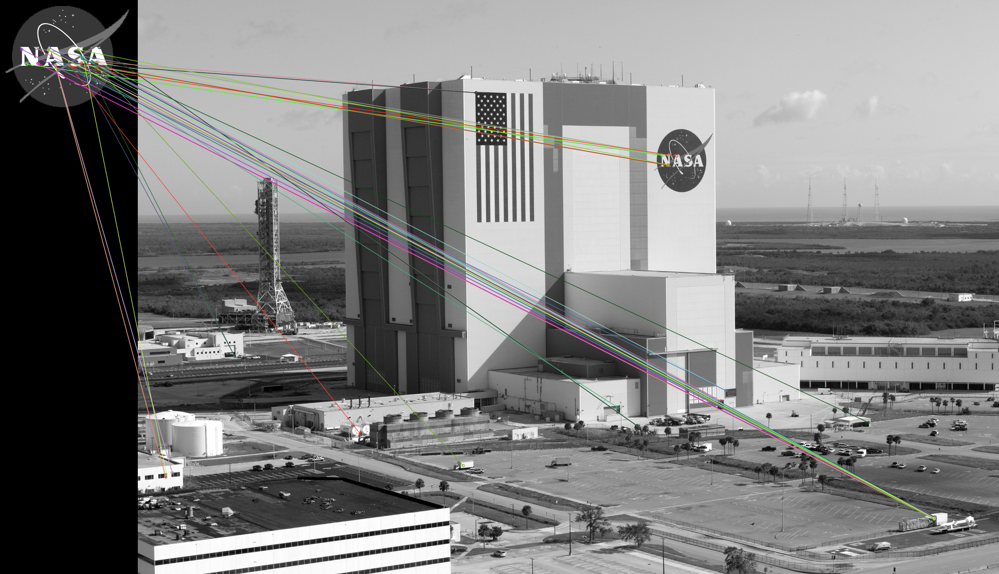

In [0]:
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=False)
pairs_of_matches = bf.knnMatch(des0, des1, k=2)

# Sort the pairs of matches by distance.
pairs_of_matches = sorted(pairs_of_matches, key=lambda x:x[0].distance)

# Draw the 25 best pairs of matches.
img_pairs_of_matches = cv2.drawMatchesKnn(
    img0, kp0, img1, kp1, pairs_of_matches[:25], img1,
    flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)

cv2_imshow(img_pairs_of_matches)



In [0]:
# Apply the ratio test.
matches = [x[0] for x in pairs_of_matches
           if len(x) > 1 and x[0].distance < 0.8 * x[1].distance]

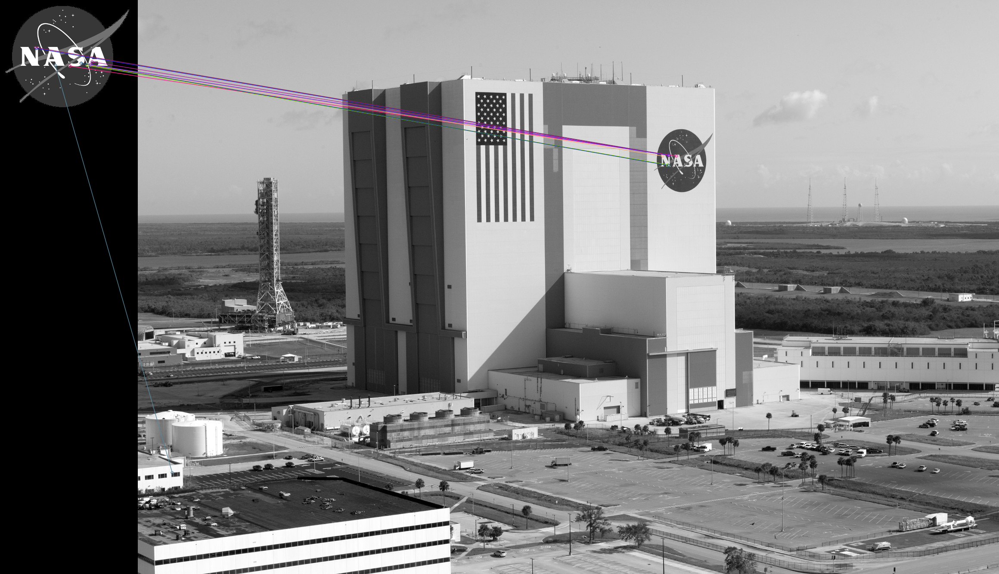

In [0]:
# Draw the best 25 matches.
img_matches = cv2.drawMatches(
    img0, kp0, img1, kp1, matches[:25], img1,
    flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)

cv2_imshow(img_matches)